## Beginners Guide to Exploratory Data Analysis in Python (EDA)

#### Objective of this Notebook
Welcome! This notebook is designed to serve as a comprehensive introduction to Exploratory Data Analysis (EDA). We'll cover what EDA is, why it's essential in machine learning, and walk through many of the most commonly used EDA techniques.

My goal is to make this notebook a one-stop resource for beginners who want to build a solid foundation and become proficient in EDA.

#### Some important Notes

I’d like to preface this by saying that I’m still learning EDA myself. This notebook is both a learning resource for others and a learning journey for me. As such, I’m using it to teach myself through practice and documentation.

If you notice any mistakes, unclear explanations, or missing details, I’d greatly appreciate feedback or suggestions for improvement. Let’s learn together!

#### Pre-requisites
Knowledge of basic python (classes and objects) and numpy,pandas,matplotlib, and seaborn will be useful here

#### Links to Resources I used

Special thanks to all the creators/content that guided me on making this tutorial.
I will leave links to all the works I used for people who want to go further in depth 

- https://www.youtube.com/@AndreyHolz
- https://www.geeksforgeeks.org/skewness-measures-and-interpretation/
- https://reinec.medium.com/my-notes-handling-skewed-data-5984de303725
- https://medium.com/@pingsubhak/handling-missing-values-in-dataset-7-methods-that-you-need-to-know-5067d4e32b62
- https://medium.com/gen-ai-adventures/bivariate-analysis-exploring-relationships-between-variables-6d4ab1cc84dc

### What Is EDA?

Exploratory Data Analysis is the process of understanding the patterns, hidden stecutures, and underlying trends of a dataset. We often represent these characterstics visually using libraries like matplotlib, seaborn, and plotly

### What is the purpose of EDA?

We conduct EDA prior to any modelling, to gain a better grasp of our datasets. These understandings can include, what problems may be in the dataset (imbalanced classes,missing data, incorrect data, outliers, etc). EDA allows us to find out what may be causing these problems, and how we can ultimately eliminate these problems

### Real World Application of EDA

When tasked to build a model on some real world dataset, such as customer segmentation. Your employer may ask you to provide some inital hypothesis. Before making these hypothesis, a good data scientist will Exploratory Data Analysis (EDA) to ensure their assumptions are grounded in reality. EDA helps answer critical questions, in a customer segmentation project, EDA might reveal:

- That age or income distributions are heavily skewed.

- That certain product categories are only purchased by specific customer groups.

- That there are natural clusters in purchasing behavior or website activity.

By visulazing these trends, this will guide us on feature selection and informs us on the type of models we should use. 

#### Dataset we will be exploring 

We will use the house prices dataset for this notebook. Which can be found here
- https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques

### Importing the libraries we will use for EDA

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import boxcox

### Loading Our Dataset into a pandas DataFrae

This is the inital step in EDA, allowing us to use numerous pandas methods to manipulate the dataset

In [2]:
df = pd.read_csv('train.csv')
df.head() # Displays the first 5 rows the dataset

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


#### Basic Data Insepction

Some comon methods

1. df.shape
    - Shows us the number of features (columns) and elements (rows)
2. df.info()
    - Shows us column types and non null counts of those columns
3. df.describe
    - Gives us the numeric stats for all features (mean,median,std,percentiles, etc)
We often use these to find out how big our dataset is, how many if any missing values are in our dataset, and if there are any clear mistakes/outliers

In [3]:
df.shape

(1460, 81)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


#### Some inital Observations

1. We are missing alot of values in LotFrontage and MasVnrArea
2. If we look at LotArea's max value, 215,245 and the 75th percentile of 11,601.5. It seems we have a massive outlier
3. BsmtFinSF1, WoodDeckSF, OpenPorchSF, ScreenPorch, PoolArea all have a median of 0, which suggests that most houses do not have these features

with this in mind, lets first clarify what these statisics mean

### Key Statiscal Measures in numerical EDA

1. Measures of Central Tendancy
    - Mean: Average value of data
    - Median: Middle value in an ordered dataset
    - Mode: Most frequent value
2. Measures of Data Spread
    - Standard Deviation: Shows how the data deviates from the mean
    - Variance: Represents the average spread of the Data
3. Inidcators of Distribution Shape
    1. Skewness: Is the symmerty of the data distribution. This values ranges from -1 to 1.
![](./images/Skewness-copy.webp)
Image from https://www.geeksforgeeks.org/skewness-measures-and-interpretation/
    3. Kurtosis is the measure of of the tailedness of a distrbution, or the measure of outliers in a distribution

Skewed data, 'Degrades the model’s ability (especially regression based models) to describe typical cases as it has to deal with rare cases on extreme values ' (Cheryl, 2020).

Now this begs the question, how do we deal with handling skewed data. 



In [119]:
num_df = df.select_dtypes(include = ['number'])

for col in num_df.columns:
        print('{:15}'.format(col), 
          'Skewness: {:05.2f}'.format(num_df[col].skew()) , 
          '   ' ,
          'Kurtosis: {:06.2f}'.format(num_df[col].kurt())  
         )

Id              Skewness: 00.00     Kurtosis: -01.20
MSSubClass      Skewness: 01.41     Kurtosis: 001.58
LotFrontage     Skewness: 02.16     Kurtosis: 017.45
LotArea         Skewness: 12.21     Kurtosis: 203.24
OverallQual     Skewness: 00.22     Kurtosis: 000.10
OverallCond     Skewness: 00.69     Kurtosis: 001.11
YearBuilt       Skewness: -0.61     Kurtosis: -00.44
YearRemodAdd    Skewness: -0.50     Kurtosis: -01.27
MasVnrArea      Skewness: 02.67     Kurtosis: 010.08
BsmtFinSF1      Skewness: 01.69     Kurtosis: 011.12
BsmtFinSF2      Skewness: 04.26     Kurtosis: 020.11
BsmtUnfSF       Skewness: 00.92     Kurtosis: 000.47
TotalBsmtSF     Skewness: 01.52     Kurtosis: 013.25
1stFlrSF        Skewness: 01.38     Kurtosis: 005.75
2ndFlrSF        Skewness: 00.81     Kurtosis: -00.55
LowQualFinSF    Skewness: 09.01     Kurtosis: 083.23
GrLivArea       Skewness: 01.37     Kurtosis: 004.90
BsmtFullBath    Skewness: 00.60     Kurtosis: -00.84
BsmtHalfBath    Skewness: 04.10     Kurtosis: 

### Handling Skewed Data

#### Log Transform

Log transform (Rightly skewed Data): What this does it compress the large values in the data, resulting in reducing the positive skew by pulling the right tail toward the center, resulting in a more normal distribution
![](./images/log_transform.jpg)
  

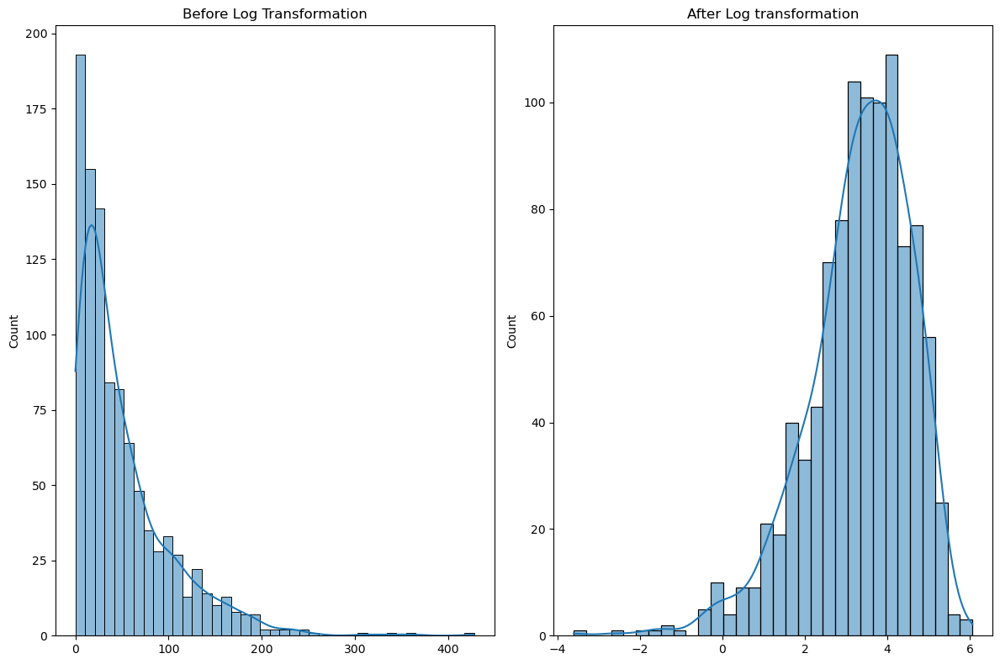

In [6]:
# Log Transformation Example

np.random.seed(0)

data = np.random.exponential(scale=50, size=1000) # We generate a postively skewed dataset

plt.figure(figsize=(12,8))

# Plotting the data distribution shape prior to the transformation
plt.subplot(1,2,1)
sns.histplot(data, kde = True)
plt.title('Before Log Transformation')

# Applying the Log Transformation
log_transformed_data = np.log(data)

# Plotting the data distribution shape after the transformation
plt.subplot(1,2,2)
sns.histplot(log_transformed_data,kde = True)
plt.title('After Log transformation')


plt.tight_layout()
plt.show()



#### Square Root transform (Rightly Skewed Data)

Transforms each point by is square root,resulting in lessening the impact of larger values.


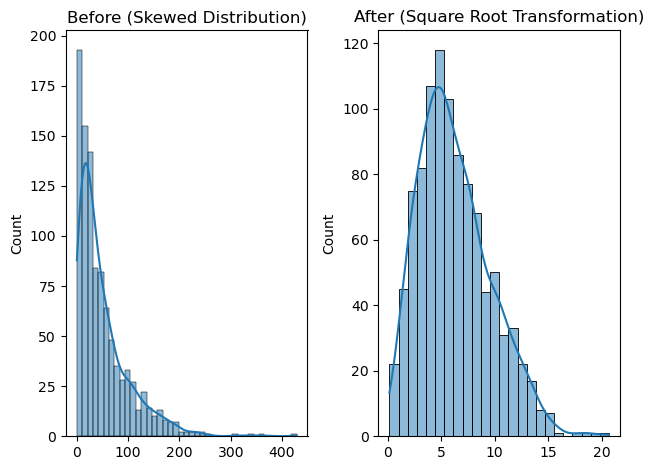

In [7]:
# Generate a positively skewed dataset
np.random.seed(0)
data = np.random.exponential(scale=50, size=1000)

# Plot before transformation
plt.subplot(1, 2, 1)
sns.histplot(data, kde=True)
plt.title("Before (Skewed Distribution)")

# Apply square root transformation
squareroot_data = np.sqrt(data)

# Plot after transformation
plt.subplot(1, 2, 2)
sns.histplot(squareroot_data, kde=True)
plt.title("After (Square Root Transformation)")

plt.tight_layout()
plt.show()


#### Cube Rooting 

For when values are being pulled by larger values (left skew)

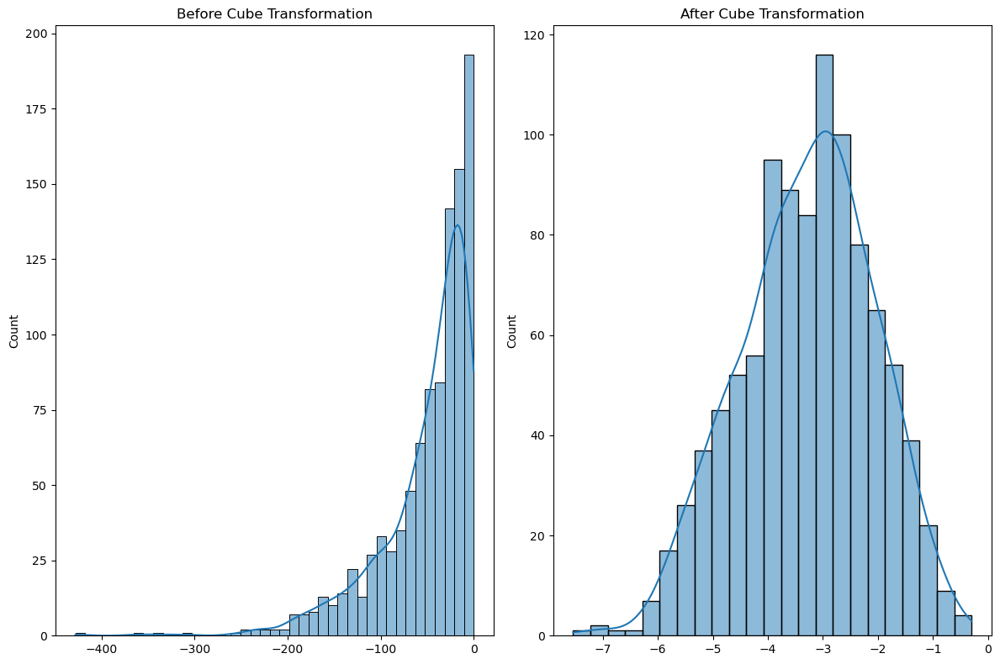

In [8]:
np.random.seed(0)

# Generates a Positively skewed dataset
data = np.random.exponential(scale = 50, size = 1000) 
data =-data # We multiple each value by a factor of -1 to create a left-skewed dataset

plt.figure(figsize=(12,8))

# Before Transformation

plt.subplot(1,2,1)
sns.histplot(data, kde = True)
plt.title('Before Cube Transformation')

# Applying transformation
cube_data = np.sign(data) * np.abs(data) ** (1/3)

# After transformation
plt.subplot(1,2,2)
sns.histplot(cube_data, kde = True)
plt.title('After Cube Transformation')



plt.tight_layout()
plt.show()

#### Box-Cox Transformation

Box-Cox transformation is a powerful method for reducing skewness and stabilizing variance in your data. It works by applying a family of power transforms, parameterized by lambda (λ), and choosing the λ that best normalises the distribution.

- Box-Cox can only be applied to data that’s greater than 0.

- If your data includes zeros or negatives, you typically need to shift it first (by adding a constant).

- Box-Cox finds the best λ by maximum likelihood — choosing a transformation that brings your data close to normal.

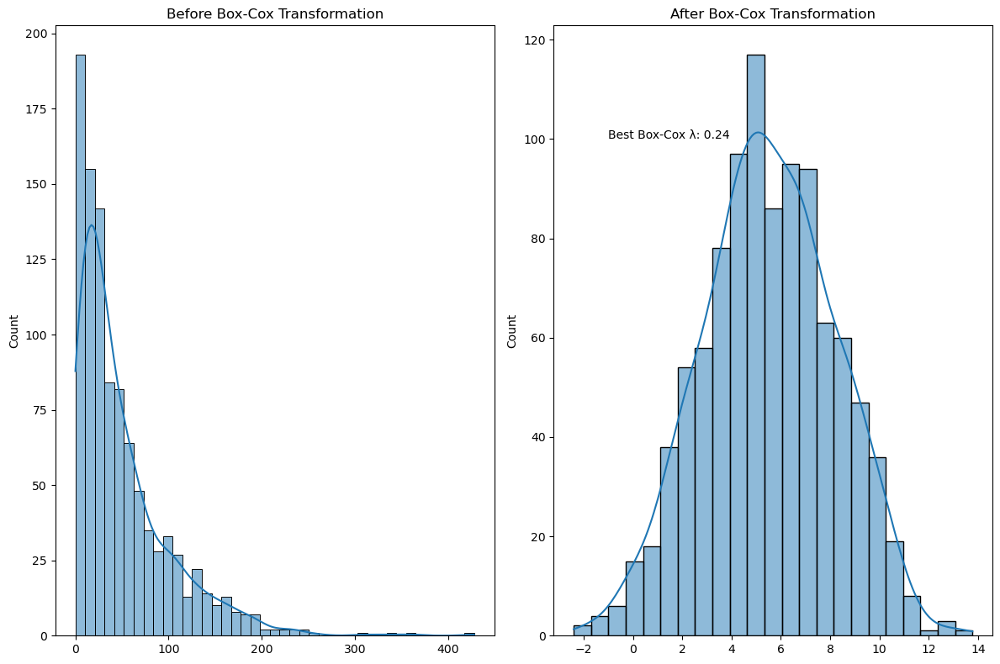

In [9]:
# Generate some data
np.random.seed(0)
data = np.random.exponential(scale = 50, size = 1000)

# Apply Box-Cox transformation
transformed_data, best_lambda = boxcox(data)

# Plot before transformation
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
sns.histplot(data, kde = True)
plt.title('Before Box-Cox Transformation')

# Plot after transformation
plt.subplot(1, 2, 2)
ax = sns.histplot(transformed_data, kde = True)
ax.text(-1, 100, f"Best Box-Cox λ: {best_lambda:.2f}")
ax.set_title('After Box-Cox Transformation')


plt.tight_layout()
plt.show()


### Handling Missing Data

we will first see how many features contain missing values

#### Why Missing Data Imputation Matters

As we've established many of our columns contain missing values. Generally we have 2 options in handling this 
1. Drop the features containing the data
    - This is only recomended if a majority of the data is missing
    - df = df.drop('col', axis = 1)
2. Drop the rows containing the missing data
    - This is generally not recommended as we lose alot of valubale data
    - df = df.dropna(axis = 1)
3. Impute the missing values (often with mean or median)
    - This is the best approach when missing a small percentage of data.
    - When dealing with a larger amount of missing values, impuation with mean and median can often result in a loss of variation, and an introduction of bias (if the dataset is imbalanced or skewed). For Categorical Columns we can use mode
        - df = df[col].fillna(df[col].mean())
        - df = df[col].fillna(df[col].median())
        - df = df[col].fillna(df[col].mode()[0]) # Assuming df is categorical
      
4. Interpolation
    - interpolation fills na values off similair datapoints. We usually use this technique in time series data, or in datasets that follow a smooth trend
    - df = df[col].interpolate(method = 'linear')
5. K-Nearest Neighbours Imputations using KNNImputer
    - KNNImputer fills in missing values via the nearest neighbours in the dataset. It does this by looking at a given point, looking at all other k sampls with similiar profiles, and computing the average of those neighbors for that feature
    - y = df['col'] # Target
    - x = df.drop(col) # Features
    - imputer = KNNImputer(n_neighbors = 5)
    - X_imputed = imputer.fit_transform(X)
6. Models handling
   - Some models like XGBoost, LGBM, or CatBoost handles these NaN value for us

Ultimately each of these methods work best depending on your dataset,missing categorical data may in itself tell us important information. But its good to have a general knowledge of these techniques

In [10]:
df.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [11]:
# Calculate missing values
missing_count = df.isna().sum().sort_values(ascending=False)
missing_pct = (df.isna().mean() * 100).round(2)

# Combine into a DataFrame (only showing columns with missing values)
missing_df = pd.concat([missing_count, missing_pct], axis=1)
missing_df.columns = ['Missing Count', 'Missing %']
missing_df = missing_df[missing_df['Missing Count'] > 0]  # Filter to only columns with missing values

missing_df

,Missing Count,Missing %
PoolQC,1453,99.52
MiscFeature,1406,96.30
Alley,1369,93.77
Fence,1179,80.75
MasVnrType,872,59.73
FireplaceQu,690,47.26
LotFrontage,259,17.74
GarageYrBlt,81,5.55
GarageCond,81,5.55
GarageType,81,5.55


Now we can use seaborns heatmap to get a better visual of this

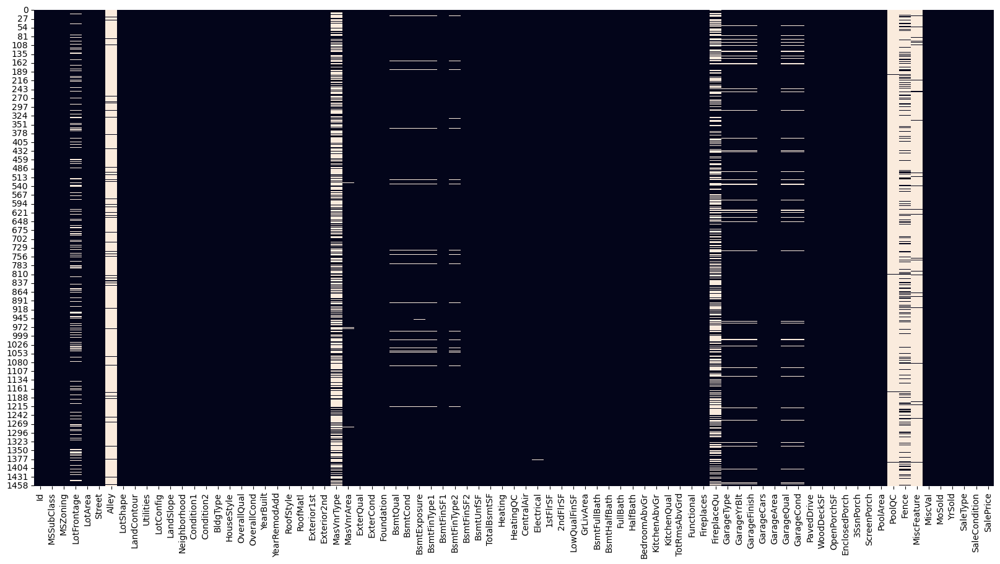

In [12]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(),cbar = False)
plt.show()

#### Univariate Analysis

Univariate Analysis is the process of analyzing the distribution, central tendancy, and spread of a feature.

#### Univariate Analysis Visualization Techniques for Continous Data

1. Histograms: We use histograms to visualize the shape of the data, to look for patterns such as skewness, multiple peaks, etc
2. Kernel Density Estimation: provides a smoothed continous probability curve, estimating where the data is most concentrated
3. Boxplot: Visulazies the 5 summary stats, (min,Q1,Median,Q3,Max)
   ![](./images/boxplot.png)
   Image from https://www.kdnuggets.com/2019/11/understanding-boxplots.html
4. Violinplot: Essentially combines boxplot + KDE to visualize the distribution shape offering a more detailed view of data distribution
   ![](./images/violinplot.png)
   Image from https://medium.com/data-science/violin-plots-explained-fb1d115e023d


In [20]:
def plotting_charts_univariate(df, feature):
    
    # Plot Histogram with KDE first
    plt.figure(figsize=(10, 6))

    sns.histplot(df[feature], kde=True, bins=5, color='skyblue')
    plt.title(f'Histogram + KDE of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.grid(True)

    # Prints Skewness
    print(f"The skew of {feature} is: {df[feature].skew()}")

    plt.tight_layout()
    plt.show()

    # Plot Box Plot with Plotly
    fig1 = px.box(
        df,
        y = feature,
        title = f"Box Plot of {feature}",
    )
    fig1.show()

    # Plot Violin Plot with Plotly
    fig2 = px.violin(
        df,
        y = feature,
        box = True,
        title = f"Violin Plot of {feature}"  
    )
    fig2.show()


The skew of SalePrice is: 1.8828757597682129


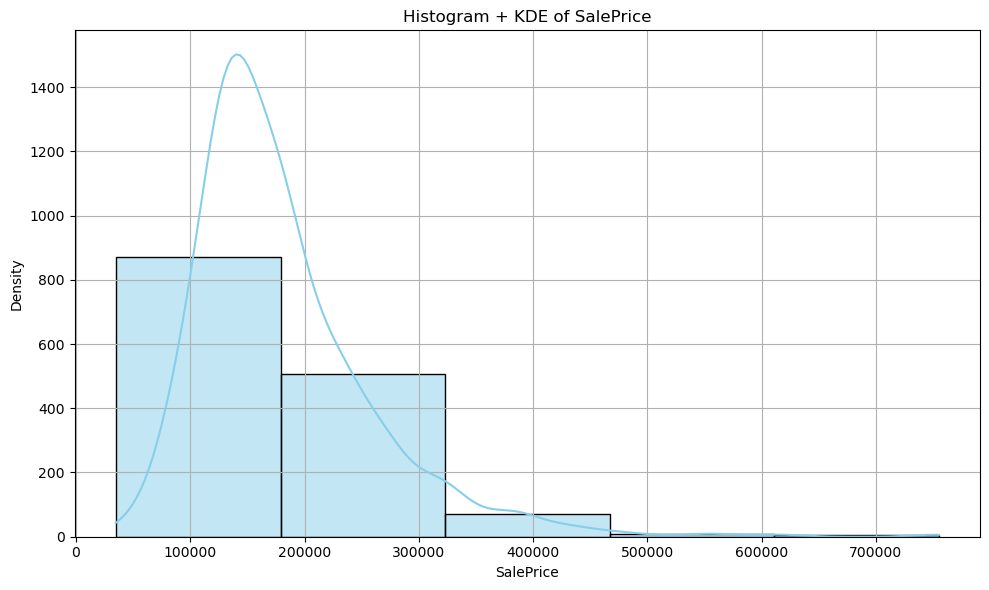

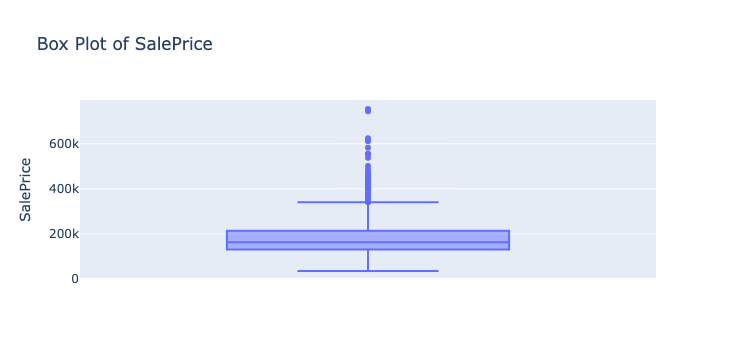

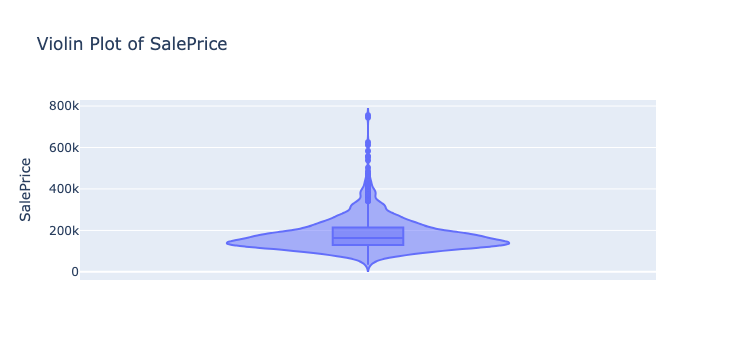

In [21]:
plotting_charts_univariate(df, 'SalePrice')

#### Takeaways

- So as we can see our target feature is strongly skewed to the right. This means most houses have lower sale prices
- We can also see from our box plot and violin plot that there are many outliers in the dataset

Lets apply some of the of the techniques we discuseed earlier on normalizing the distrbution of the target variable

Remember as we have established, some techniques we can use for normalizing right skewed data is, Log transformation, square root transformation, and box cox

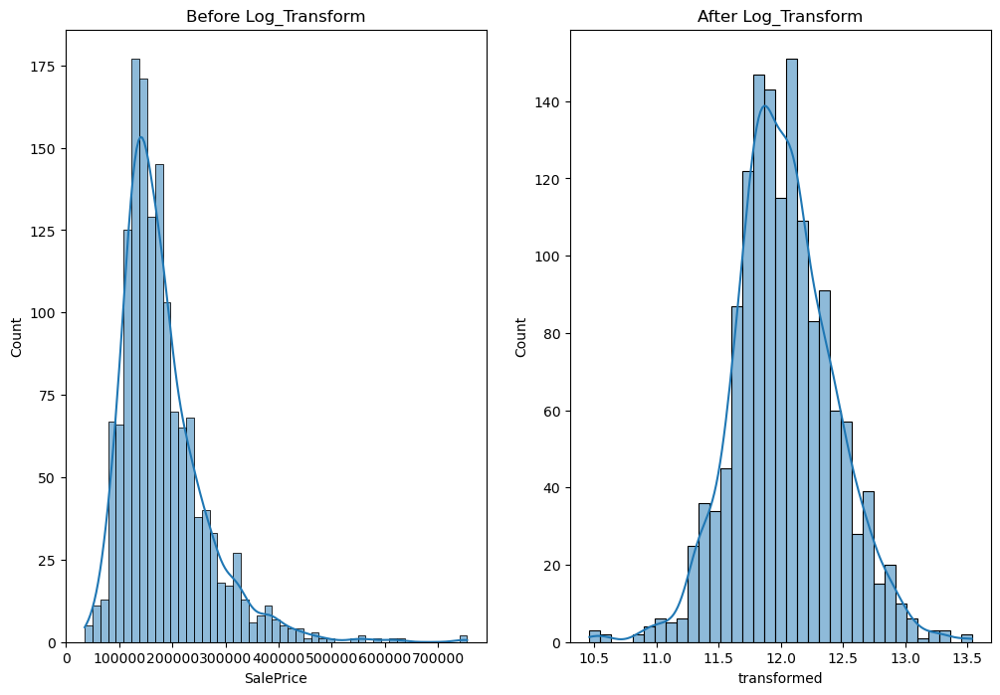

Skew before: 1.88
Skew after: 0.12


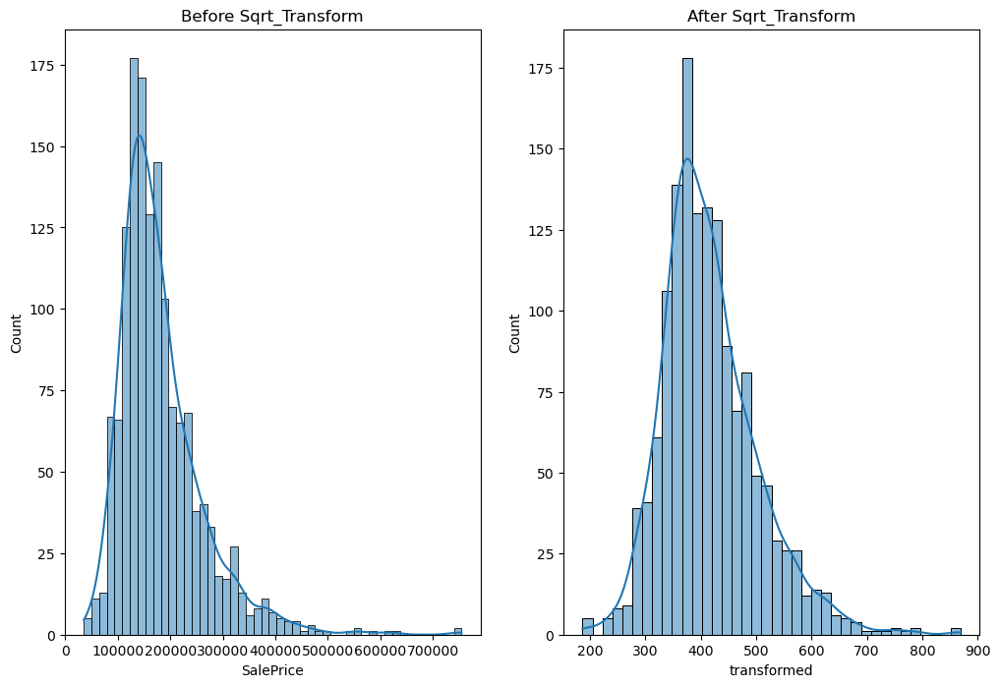

Skew before: 1.88
Skew after: 0.94


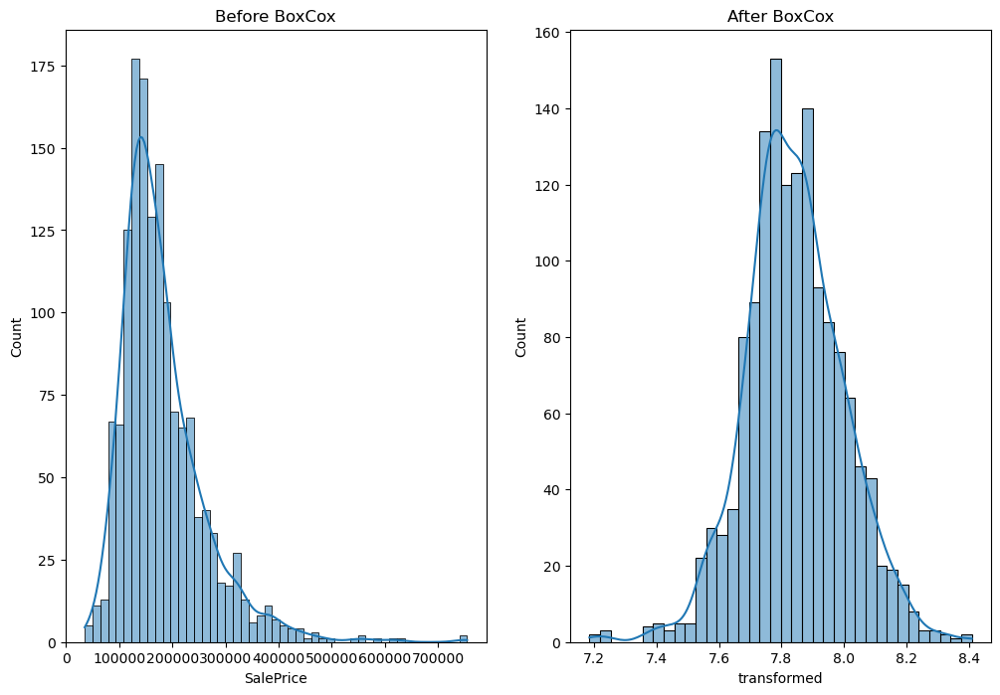

Skew before: 1.88
Skew after: -0.01


In [19]:
def skew_before_after(feature,transform):
    global test_df
    test_df = df.copy()
    if transform == 'Log_Transform':
        test_df['transformed'] = np.log(test_df[feature] + 1)
    elif transform == 'Sqrt_Transform':
        test_df['transformed'] = np.sqrt(test_df[feature])
    elif transform == 'BoxCox':
        # Boxcox requires positive values
        test_df['transformed'], best_lambda =boxcox(test_df[feature] + 1)
    else:
        raise ValueError(f"Unknown transform: {transform}")
    feature_transform = np.log(test_df[feature]+1)
    fig, axes = plt.subplots(1,2,figsize=(12,8)) 
    sns.histplot(test_df[feature], kde =True, ax = axes[0]).set_title(f"Before {transform}")
    sns.histplot(test_df['transformed'], kde =True, ax = axes[1]).set_title(f"After {transform}")
    plt.show()

    print(f"Skew before {transform}: {test_df[feature].skew():.2f}")
    print(f"Skew after {transform}: {test_df['transformed'].skew():.2f}")    

skew_before_after('SalePrice','Log_Transform')    
skew_before_after('SalePrice','Sqrt_Transform')
skew_before_after('SalePrice','BoxCox')

So as we can see the BoxCox preforms best at normalizing the SalePrice Distribution.

### Bivariate Analysis

Bivariate analysis is modeling the relationship between 2 variable/features. 
There are 3 types of analysis, which all depends on the variables we are working with

1. Numerical vs Numerical Analysis
2. Categorical vs Categorical
3. Categorical vs Numerical



#### Numerical vs Numerical 

Since both variables are numeric, we can analyze their relationship using the following methods

1. Covariance: Measures how variables change over time, or in other words do two variables increase or decrease together
    - If Covariance > 0, both are proportional to each other (if one variable goes up the second one follows that trend)
    - If Covariance < 0, both are inversely proportional to each other (if one variable goes up the second one goes down)
    - If Covariance == 0, the variables have no linear relationship
![](./images/cov.png)
Image from: https://www.statisticshowto.com/probability-and-statistics/statistics-definitions/covariance/

Its Important to note that covariance doesnt provide the strength of the relationships, for that we need Correlation

2. Pearson Correlation Coefficent: Measures the strength and direction between 2 numeric varibles ranging from -1 to 1. Pearson Correlation assumes a normal distribution and linear relation between the 2 variables
    - +1: Perfect Positive Linear Relationship
    - -1: Perfect Negative Linear Relationship
    - 0: No Linear Relationship
3. Spearman's Rank Correlation: Measures the strength and direction between 2 numeric variables ranging from -1 to 1, but assumes a monotomic relationship (variables move in a somewhat constant direction but are not defined as linear).

![](./images/pearson_vs_spearman.png)

Now lets discuss visualization techniques from numeric vs numeric variables

#### Numeric vs Numeric Visualization Techniques


1. Scatter plot: Plots the points showing the relationship between 2 variables. Helping us identify any linear or monotomic relationship between the data
2. Correlation Table: A correlation table displays the Pearson correlation coefficents for every value pair
3. Heatmap: A heatmap is a visualization of a correlation matrix, which shows the correlation coefficents vetween numeric variables.
4. Jointplot: Combines a scatter plot with univarate distrbutions for each variable 

Now lets see these in practice

In [138]:
num_df = df.select_dtypes(include = ['number'])

def numeric_vs_numeric_charts(feature1, feature2):
        
    plt.figure(figsize=(10,8))
    sns.scatterplot(x = feature1, y= feature2, data=num_df)
    plt.title(f"Scatter plot of {feature1} and {feature2}")
    plt.show()

    plt.figure(figsize=(20,12))
    sns.heatmap(num_df.corr(method = 'spearman'),cmap = 'coolwarm',annot = True, fmt = '.2f')
    plt.title(f"Heat Map (Spearman) of {feature1} and {feature2}")
    plt.show()

    plt.figure(figsize=(20,12))

    sns.heatmap(num_df.corr(method = 'pearson'),cmap = 'Blues',annot=True, fmt='.2f')
    plt.title(f"Heat Map (Pearson) of {feature1} and {feature2}")
    plt.show()

    sns.jointplot(data=num_df, x = feature1,y = feature2)
    plt.title(f"Joint plot of {feature1} and {feature2}")
    plt.show()

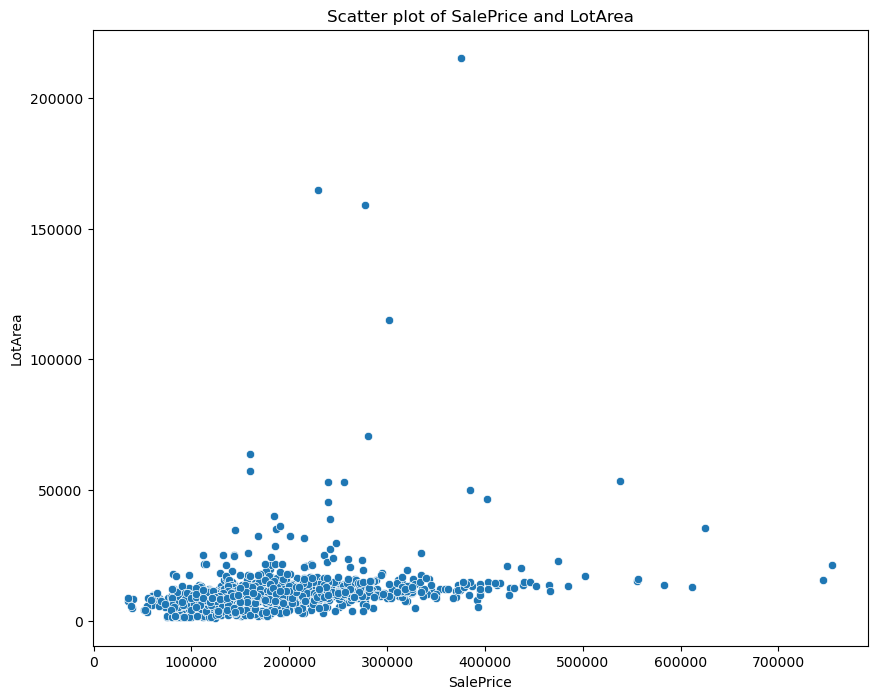

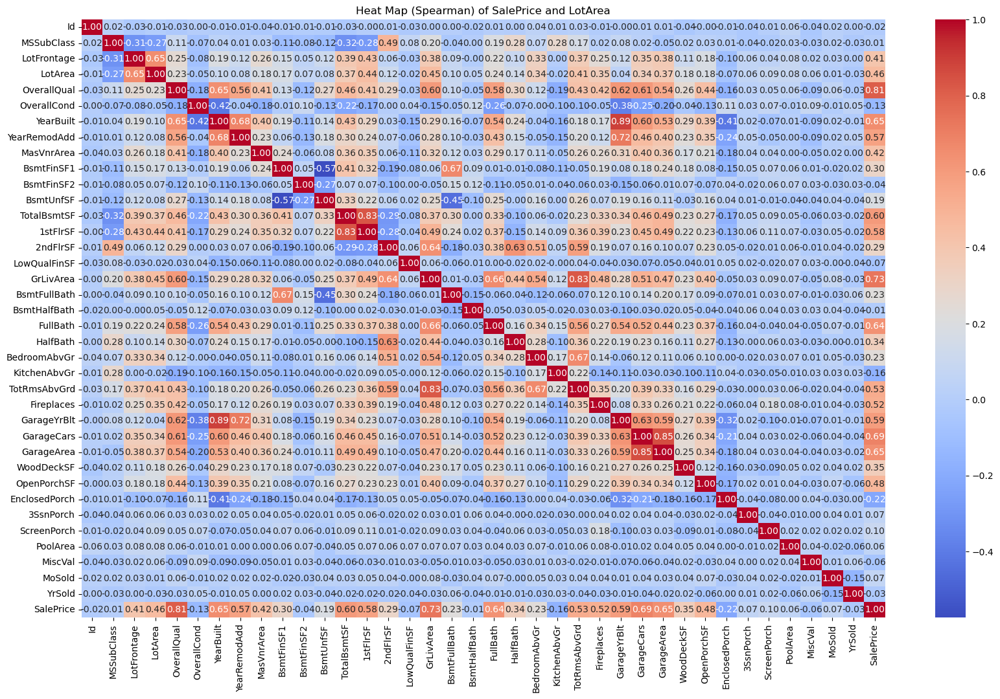

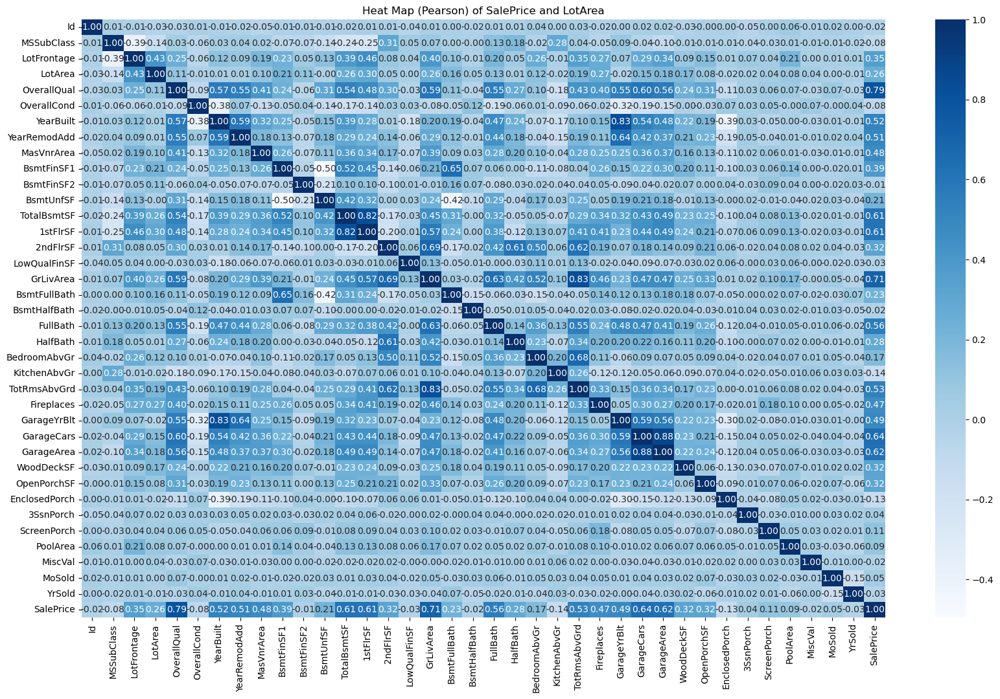

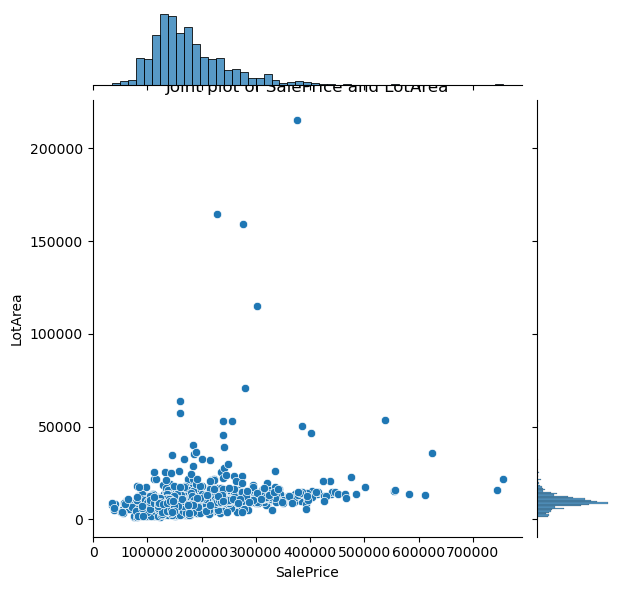

In [139]:
numeric_vs_numeric_charts('SalePrice','LotArea')

#### Numeric vs Categorical 

1. Categorical Mean: For the categorical data, we can directly compute the mean, so we compute the mean of a numerical variable within each category. Think "What is the average income by gender".
    - Given a numerical variable Salary and categorical Gender.
    - We compute the mean salary for each gender
2. Hypothesis Testing: Answers the question are the means or distribtions of the numieric variable different across different categories. This is a bit too indepth for the purposes of this notebook, if you are interseted you can perform statistical tests (like t-tests or ANOVA) to see whether differences are significant — but that's a more advanced step.”

#### Numeric vs Categorical Visualization Techniques

1. Box plot
2. Violin plot
3. Bar Chart


Lets see this in practice


In [88]:
def numeric_vs_categoric(categoric,numeric):
    
    fig1= px.box(df, x = categoric, y = numeric, title = f"Box plot of: {categoric} by {numeric}")
    fig1.show()

    fig2 = px.violin(df, x = categoric, y = numeric, title = f"Violin plot of: {categoric} by {numeric}", box = True)
    fig2.show()

    sns.barplot(data=df, x = categoric, y = numeric)
    plt.title(f"Bar Chart of: {categoric} by {numeric}")
    plt.show()

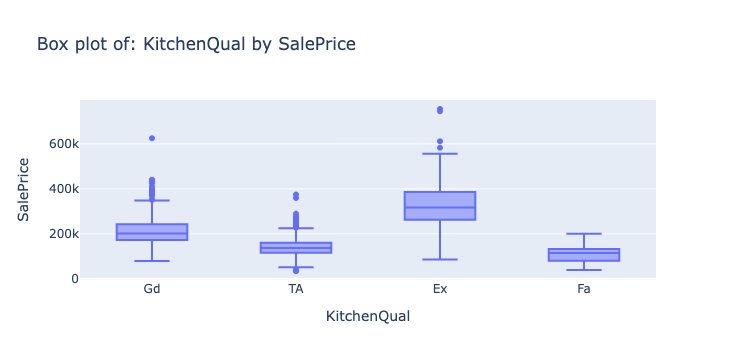

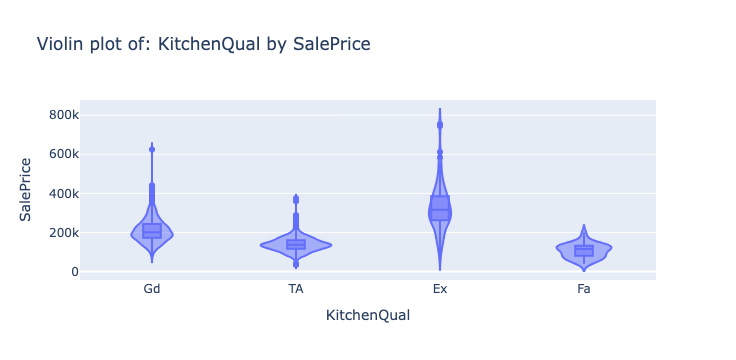

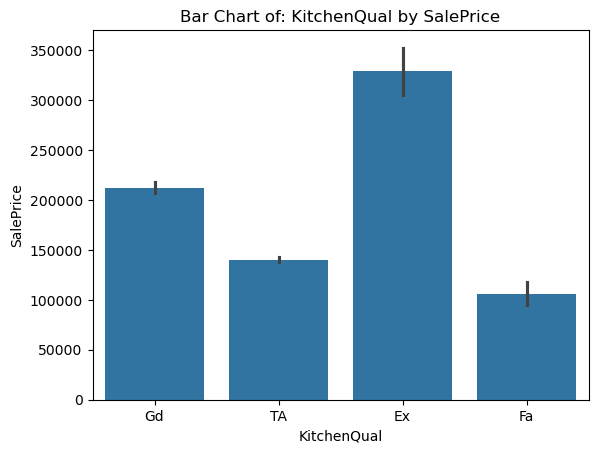

In [89]:
numeric_vs_categoric('KitchenQual','SalePrice')

#### Categorical vs Categorical 

1. Cross Tabulation: Cross tab is a table that displays the frequencies of 2 categorical features in a count or percentage format

#### Categorical vs Categorical Visualization Techniques

1. Bar Plot: A group of bar plots showing counts or percentages for each combination of categorical variable. We use this for side-by-side comparisons
2. Stacked Bar plot: Stays categories, usefull for seeing proportions



In [102]:
def categoric_vs_categoric(feature1, feature2):

    cross_tab = pd.crosstab(df[feature1],df[feature2])
    print(cross_tab)

    sns.countplot(data=df, x= feature1, hue=feature2)
    plt.title(f"Grouped Bar Plot: {feature1} vs {feature2}")
    plt.show()


    cross_tab.plot(kind='bar', stacked = 'True')
    plt.title(f"Stacked Bar Plot: {feature1} vs {feature2}") 
    plt.show()


LotConfig      Corner  CulDSac  FR2  FR3  Inside
SaleCondition                                   
Abnorml            27        6    1    0      67
AdjLand             0        1    1    0       2
Alloca              0        2    0    0      10
Family              6        0    0    0      14
Normal            211       79   42    4     862
Partial            19        6    3    0      97


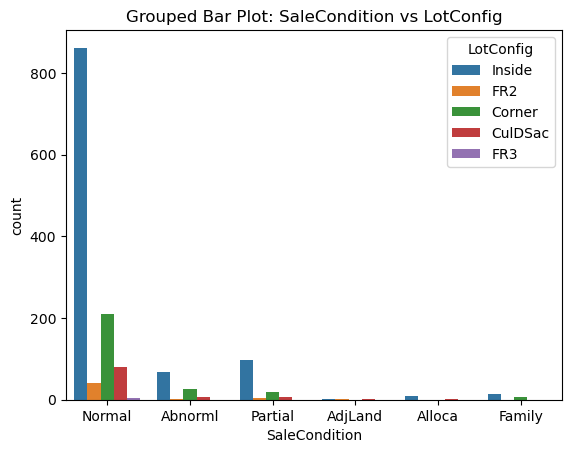

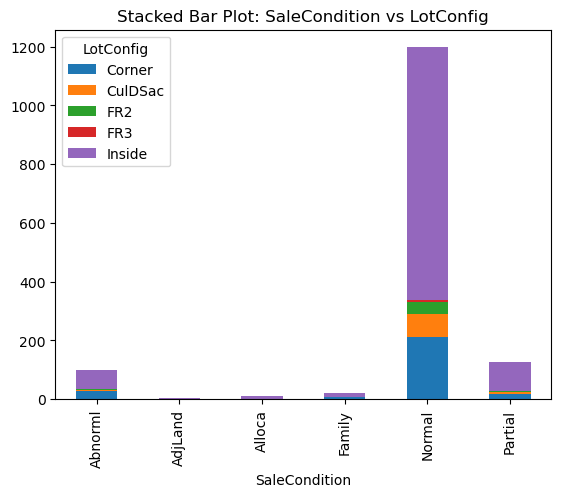

In [104]:
categoric_vs_categoric('SaleCondition','LotConfig')

### Multivariate Analysis

multivariate EDA explores the modeling of the relationships among 3 variables or more

#### Multivariate Analysis Visualization Tecniques

1. Pairplot: Shows a scatter plot of all pairs of numerical variales in a matrix
2. Heatmap
3. 3D Scatter Plot: Visualizes 3 numerical variables in a 3D space




In [114]:
def multivariate_plots(feature1,feature2,feature3):
    sns.pairplot(df)

    fig = px.scatter_3d(df, x = feature1, y = feature2, z = feature3)
    fig.show()

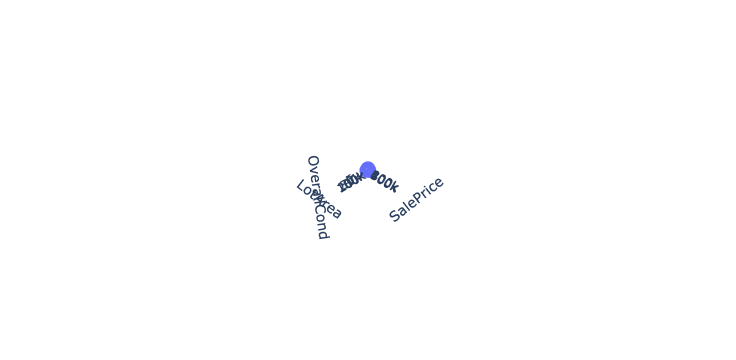

In [115]:
multivariate_plots('SalePrice','LotArea','OverallCond')

### Outlier Detection 

As we have seen, much of the analysis we’ve been conducting involves cleaning the data — for instance, by filling in missing values — or exploring the distribution, trends, and relationships within our features. Another important application of the techniques we’ve been using in EDA is outlier detection.

Outliers are data that are vary signifcantly from the rest of the datset. Think of a class of students, who's scores roughly deviated from 35% - 60%. Then you find a student who scored a 90%. That student would be an outlier.

This issue with outliers is that as we have seen earlier, can skew our data. This is bad for machine learning projects as then the models we that learn from this data pick up on these pattterns, and depedning on the type of model it may try to overfit to these outliers resulting in a less accurate prediction

#### Handling Outliers

1. Visualization: We've explored this already using scatter plots, boxplots and violin plots
2. Clipping: Sets upper and lower bounds on values, like cutting all values not within the 95th qunatile
3. Remove them: If they are clearly errors (A SalePrice of 10000000000)
4. Transform the Data: Using log transform or square root transforms (depending on thr data type of the feature)
5. Use Models: Models like decision trees and random forest are less sensitvy to outliers. This is best for datasets where you would expect outliers like financial data.